In [1]:
import math
import torch
import numpy as np
import pandas as pd
import seaborn as sns
import os
import pickle
import matplotlib 
matplotlib.use('Agg')
from matplotlib import pyplot as plt
import sklearn
from sklearn.model_selection import KFold

%matplotlib inline
%load_ext autoreload
%autoreload 2
%reload_ext autoreload
import imblearn as imb

from sklearn.metrics import confusion_matrix
import itertools

from scipy.stats import randint
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve, precision_recall_curve, auc, recall_score, confusion_matrix

from sklearn.ensemble import RandomForestClassifier
from imblearn.ensemble import BalancedRandomForestClassifier

import sys
sys.path.append('../../')
# import utils
from sklearn.model_selection import GridSearchCV

from split_data import *

from RF_atomver import *

In [2]:
def get_arrays(file_path, df_filename, filename_type=None, save=False):
    """use dataframes to get trainX, trainy, testX, testy out. Optional: save those files to csv
    file_path: directory
    df_filename: dataframe NEK#_binding_moe_{sampling}_df.csv (sampling: scaled, UNDER, SMOTE, ADASYN)
    split dataframe to train and test, and x and y
    save: bool, option to save splits to separate csv files (train X, train y, test X, test y) 
    returns: numpy arrays train X, train y, testX, test y"""
    df = pd.read_csv(file_path+df_filename)
    train_df= df[df['subset']=='train']
    test_df = df[df['subset']=='test']
    train_y = train_df['active'].to_numpy().reshape(-1)
    test_y=test_df['active'].to_numpy().reshape(-1)
    train_x_df = train_df.drop(columns='active')

  
    test_x_df = test_df.drop(columns='active')
    
    train_x_df = train_df.drop(columns='active')
    test_x_df = test_df.drop(columns='active')
    trainX = train_x_df.select_dtypes(include='number').to_numpy()
    testX = test_x_df.select_dtypes(include='number').to_numpy()
    
    print(f'train X shape: {trainX.shape}, y: {train_y.shape}, test X: {testX.shape}, y:{test_y.shape}')
    if (save and filename_type is not None): 
        trainxdf = pd.DataFrame(trainX)
        trainxdf.to_csv(file_path+filename_type+'_trainX.csv', index=False)
        # train_x_df.to_csv(filename_type+'_trainX.csv', index=False)
        trainy_df = pd.DataFrame(train_y)
        trainy_df.to_csv(file_path+filename_type+'_train_y.csv', index=False) 
        # test_x_df.to_csv(filename_type+'_testX.csv', index=False)
        testxdf = pd.DataFrame(testX)
        testxdf.to_csv(file_path+filename_type+'_testX.csv', index=False)
        testy_df = pd.DataFrame(test_y)
        testy_df.to_csv(file_path+filename_type+'_test_y.csv', index=False) 
        
    return trainX, train_y, testX, test_y

In [39]:
trainX, trainy, testX, testy = get_arrays('/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/NEK2/bind/','NEK2_binding_moe_scaled_df.csv')

train X shape: (1125, 306), y: (1125,), test X: (283, 306), y:(283,)


In [12]:
parameters = {}

# param_dist = {
#     'n_estimators': np.linspace(100, 2000, 5, dtype = int),
#     'max_depth': [20, 100, 200, 250],
#     'min_samples_split': [2, 3,4],
#     'min_samples_leaf': [2, 3, 4],
#     'criterion': ['gini','entropy'],

# }
param_dist = {
    'n_estimators': np.linspace(100, 2000, 5, dtype = int),
    'max_depth': [20, 100, 200, 250],
    'min_samples_split': [2, 3,4],
    'min_samples_leaf': [2, 3, 4],
    'criterion': ['gini','entropy'],
    'class_weight':[ None, 'balanced','balanced_subsample']
    # min_weight_fraction_leaf: 0.0
}

# Grid search NEK2 Bind MFP and MOE feats

In [13]:
scaled_moe_bind = find_best_models(trainX, trainy, testX, testy, 'RF', parameters, param_dist,  verbose_val=2) 
# start June 12 1:52 pm - 2:39 pm
# start again 2:39 end 3:20
# start with larger grid: Jun 12 9:06 pm - 9 53

Fitting 5 folds for each of 1080 candidates, totalling 5400 fits
[CV] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.5s
[CV] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=1050; total time=   4.5s
[CV] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=1525; total time=   5.6s
[CV] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=3, n_estimators=100; total time=   0.9s
[CV] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=3, n_estimators=575; total time=   2.4s
[CV] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=3, n_estimators=575; total time=   2.2s
[CV] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=3, n_estimators=1050;

In [14]:
scaled_moe_bind_model = scaled_moe_bind.best_estimator_
for p, val in scaled_moe_bind_model.get_params().items(): 
    print(f'{p}: {val}')

bootstrap: True
ccp_alpha: 0.0
class_weight: balanced
criterion: gini
max_depth: 100
max_features: sqrt
max_leaf_nodes: None
max_samples: None
min_impurity_decrease: 0.0
min_samples_leaf: 3
min_samples_split: 4
min_weight_fraction_leaf: 0.0
n_estimators: 100
n_jobs: None
oob_score: False
random_state: None
verbose: 0
warm_start: False


In [15]:
data_path ='/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/NEK2/bind/'
trainX_mfp, trainy_mfp, testX_mfp, testy_mfp = get_arrays(data_path,'NEK2_binding_mfp_scaled_df.csv')
scaled_mfp_bind_search = find_best_models(trainX_mfp, trainy_mfp, testX_mfp, testy_mfp, 'RF', parameters, param_dist,  verbose_val=2) 
# start Jun 12 3:23 pm - end 3:44 pm , larger grid start 9:53 pm-10:30 

train X shape: (1125, 2048), y: (1125,), test X: (283, 2048), y:(283,)
Fitting 5 folds for each of 1080 candidates, totalling 5400 fits
[CV] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=575; total time=   1.5s
[CV] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=1050; total time=   2.5s
[CV] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=2000; total time=   4.9s
[CV] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=3, n_estimators=1050; total time=   2.4s
[CV] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=3, n_estimators=2000; total time=   4.7s
[CV] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=4, n_estimators=1050; total time=   2.5s
[CV] END class_weight=None, criterion=gini,

In [16]:
scaled_mfp_bind_model = scaled_mfp_bind_search.best_estimator_
for p, val in scaled_mfp_bind_model.get_params().items(): 
    print(f'{p}: {val}')

bootstrap: True
ccp_alpha: 0.0
class_weight: balanced_subsample
criterion: entropy
max_depth: 250
max_features: sqrt
max_leaf_nodes: None
max_samples: None
min_impurity_decrease: 0.0
min_samples_leaf: 2
min_samples_split: 3
min_weight_fraction_leaf: 0.0
n_estimators: 100
n_jobs: None
oob_score: False
random_state: None
verbose: 0
warm_start: False


In [17]:
# BRFC 
data_path ='/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/NEK2/bind/'
scaled_moe_bind_search_BRFC = find_best_models(trainX, trainy, testX, testy, 'RF', parameters, param_dist,  verbose_val=2)
# June 12 10:31 pm - 11:18 pm

Fitting 5 folds for each of 1080 candidates, totalling 5400 fits
[CV] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.4s
[CV] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=1050; total time=   4.6s
[CV] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=1525; total time=   6.6s
[CV] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=3, n_estimators=575; total time=   2.6s
[CV] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=3, n_estimators=1050; total time=   4.6s
[CV] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=3, n_estimators=1525; total time=   6.6s
[CV] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=4, n_estimators=575

In [18]:
scaled_mfp_bind_BRFC_model = scaled_moe_bind_search_BRFC.best_estimator_
for p, val in scaled_mfp_bind_BRFC_model.get_params().items(): 
    print(f'{p}: {val}')

bootstrap: True
ccp_alpha: 0.0
class_weight: balanced
criterion: gini
max_depth: 200
max_features: sqrt
max_leaf_nodes: None
max_samples: None
min_impurity_decrease: 0.0
min_samples_leaf: 4
min_samples_split: 3
min_weight_fraction_leaf: 0.0
n_estimators: 100
n_jobs: None
oob_score: False
random_state: None
verbose: 0
warm_start: False


# Inhibition

In [19]:
data_path ='/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/NEK2/inhib/'
trainX_moe_inhib, trainy_moe_inhib, testX_moe_inhib, testy_moe_inhib= get_arrays(data_path,'NEK2_inhibition_moe_scaled_df.csv')
scaled_moe_inhib_search = find_best_models(trainX_moe_inhib, trainy_moe_inhib, testX_moe_inhib, testy_moe_inhib, 'RF', parameters, param_dist,  verbose_val=2) 
# start June 12 after 11:18 pm 

train X shape: (1635, 306), y: (1635,), test X: (409, 306), y:(409,)
Fitting 5 folds for each of 1080 candidates, totalling 5400 fits
[CV] END class_weight=balanced, criterion=entropy, max_depth=250, min_samples_leaf=4, min_samples_split=3, n_estimators=1525; total time=   6.6s
[CV] END class_weight=balanced, criterion=entropy, max_depth=250, min_samples_leaf=4, min_samples_split=3, n_estimators=2000; total time=   7.1s
[CV] END class_weight=balanced, criterion=entropy, max_depth=250, min_samples_leaf=4, min_samples_split=4, n_estimators=1525; total time=   5.7s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.4s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.4s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=575; 

In [20]:
scaled_moe_inhib_model = scaled_moe_inhib_search.best_estimator_
for p, val in scaled_moe_inhib_model.get_params().items(): 
    print(f'{p}: {val}')

bootstrap: True
ccp_alpha: 0.0
class_weight: balanced
criterion: gini
max_depth: 200
max_features: sqrt
max_leaf_nodes: None
max_samples: None
min_impurity_decrease: 0.0
min_samples_leaf: 3
min_samples_split: 3
min_weight_fraction_leaf: 0.0
n_estimators: 100
n_jobs: None
oob_score: False
random_state: None
verbose: 0
warm_start: False


In [21]:
trainX_mfp_inhib, trainy_mfp_inhib, testX_mfp_inhib, testy_mfp_inhib= get_arrays(data_path,'NEK2_inhibition_mfp_scaled_df.csv')
scaled_mfp_inhib_search = find_best_models(trainX_mfp_inhib, trainy_mfp_inhib, testX_mfp_inhib, testy_mfp_inhib, 'RF', parameters, param_dist,  verbose_val=2) 
# start June 12 after 10:51 pm 

train X shape: (1635, 2048), y: (1635,), test X: (409, 2048), y:(409,)
Fitting 5 folds for each of 1080 candidates, totalling 5400 fits
[CV] END class_weight=None, criterion=entropy, max_depth=250, min_samples_leaf=3, min_samples_split=4, n_estimators=100; total time=   0.5s
[CV] END class_weight=None, criterion=entropy, max_depth=250, min_samples_leaf=3, min_samples_split=4, n_estimators=575; total time=   3.1s
[CV] END class_weight=None, criterion=entropy, max_depth=250, min_samples_leaf=3, min_samples_split=4, n_estimators=575; total time=   3.1s
[CV] END class_weight=None, criterion=entropy, max_depth=250, min_samples_leaf=3, min_samples_split=4, n_estimators=1525; total time=   8.3s
[CV] END class_weight=None, criterion=entropy, max_depth=250, min_samples_leaf=3, min_samples_split=4, n_estimators=2000; total time=  10.7s
[CV] END class_weight=None, criterion=entropy, max_depth=250, min_samples_leaf=4, min_samples_split=2, n_estimators=1525; total time=   8.1s
[CV] END class_weight

In [23]:
scaled_mfp_inhib_model = scaled_mfp_inhib_search.best_estimator_
for p, val in scaled_mfp_inhib_model.get_params().items(): 
    print(f'{p}: {val}')

bootstrap: True
ccp_alpha: 0.0
class_weight: balanced_subsample
criterion: gini
max_depth: 250
max_features: sqrt
max_leaf_nodes: None
max_samples: None
min_impurity_decrease: 0.0
min_samples_leaf: 2
min_samples_split: 3
min_weight_fraction_leaf: 0.0
n_estimators: 575
n_jobs: None
oob_score: False
random_state: None
verbose: 0
warm_start: False


In [24]:
data_path ='/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/NEK2/inhib/'
trainX_moe_inhib, trainy_moe_inhib, testX_moe_inhib, testy_moe_inhib= get_arrays(data_path,'NEK2_inhibition_moe_scaled_df.csv')
scaled_moe_inhib_search_BRFC_search = find_best_models(trainX_moe_inhib, trainy_moe_inhib, testX_moe_inhib, testy_moe_inhib, 'RF', parameters, param_dist,  verbose_val=2) 
# start June 13 7:44 am

train X shape: (1635, 306), y: (1635,), test X: (409, 306), y:(409,)
Fitting 5 folds for each of 1080 candidates, totalling 5400 fits
[CV] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=575; total time=   4.4s
[CV] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=1525; total time=  12.1s
[CV] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=3, n_estimators=100; total time=   0.7s
[CV] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=3, n_estimators=100; total time=   1.4s
[CV] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=3, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, criterion=gini, max_d

In [25]:
scaled_moe_inhib_model_BRFC = scaled_moe_inhib_search_BRFC_search.best_estimator_
for p, val in scaled_moe_inhib_model_BRFC.get_params().items(): 
    print(f'{p}: {val}')

bootstrap: True
ccp_alpha: 0.0
class_weight: balanced_subsample
criterion: gini
max_depth: 250
max_features: sqrt
max_leaf_nodes: None
max_samples: None
min_impurity_decrease: 0.0
min_samples_leaf: 4
min_samples_split: 4
min_weight_fraction_leaf: 0.0
n_estimators: 100
n_jobs: None
oob_score: False
random_state: None
verbose: 0
warm_start: False


In [26]:
trainX_mfp_inhib_, trainy_mfp_inhib, testX_mfp_inhib, testy_mfp_inhib= get_arrays(data_path,'NEK2_inhibition_mfp_scaled_df.csv')
scaled_mfp_inhib_BRFC_search = find_best_models(trainX_mfp_inhib, trainy_mfp_inhib, testX_mfp_inhib, testy_mfp_inhib, 'RF', parameters, param_dist,  verbose_val=2) 
# start after June 13 9:00 am

train X shape: (1635, 2048), y: (1635,), test X: (409, 2048), y:(409,)
Fitting 5 folds for each of 1080 candidates, totalling 5400 fits
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=4, n_estimators=1050; total time=   5.6s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=4, n_estimators=2000; total time=  10.8s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=3, min_samples_split=2, n_estimators=1050; total time=   5.4s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=3, min_samples_split=2, n_estimators=1525; total time=   7.9s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=3, min_samples_split=3, n_estimators=100; total time=   0.5s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=3, min_samples_split=

In [27]:
scaled_mfp_inhib_model_BRFC = scaled_mfp_inhib_BRFC_search.best_estimator_
for p, val in scaled_mfp_inhib_model_BRFC.get_params().items(): 
    print(f'{p}: {val}')

bootstrap: True
ccp_alpha: 0.0
class_weight: balanced
criterion: gini
max_depth: 100
max_features: sqrt
max_leaf_nodes: None
max_samples: None
min_impurity_decrease: 0.0
min_samples_leaf: 2
min_samples_split: 3
min_weight_fraction_leaf: 0.0
n_estimators: 100
n_jobs: None
oob_score: False
random_state: None
verbose: 0
warm_start: False


In [40]:
data_path ='/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/NEK2/bind/'
trainX_moe_UNDER, trainy_moe_UNDER, testX_moe_UNDER, testy_moe_UNDER= get_arrays(data_path,'NEK2_binding_moe_UNDER_df.csv')
# scaled_moe_bind_UNDERsearch = find_best_models(trainX_moe_UNDER, trainy_moe_UNDER, testX_moe_UNDER, testy_moe_UNDER, 'RF', parameters, param_dist,  verbose_val=2) 
# start June 13 10 am - 10:09 am

train X shape: (90, 306), y: (90,), test X: (283, 306), y:(283,)


In [31]:
scaled_moe_bind_UNDER_model = scaled_moe_bind_UNDERsearch.best_estimator_
for p, val in scaled_moe_bind_UNDER_model.get_params().items(): 
    print(f'{p}: {val}')

bootstrap: True
ccp_alpha: 0.0
class_weight: balanced
criterion: gini
max_depth: 200
max_features: sqrt
max_leaf_nodes: None
max_samples: None
min_impurity_decrease: 0.0
min_samples_leaf: 4
min_samples_split: 4
min_weight_fraction_leaf: 0.0
n_estimators: 575
n_jobs: None
oob_score: False
random_state: None
verbose: 0
warm_start: False


In [32]:
data_path ='/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/NEK2/bind/'
trainX_mfp_UNDER, trainy_mfp_UNDER, testX_mfp_UNDER, testy_mfp_UNDER= get_arrays(data_path,'NEK2_binding_mfp_UNDER_df.csv')
scaled_mfp_bind_UNDERsearch = find_best_models(trainX_mfp_UNDER, trainy_mfp_UNDER, testX_mfp_UNDER, testy_mfp_UNDER, 'RF', parameters, param_dist,  verbose_val=2) 
# start June 13 10:11 am - 10:18

train X shape: (90, 2048), y: (90,), test X: (283, 2048), y:(283,)
Fitting 5 folds for each of 1080 candidates, totalling 5400 fits
[CV] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=575; total time=   0.3s
[CV] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=1525; total time=   0.9s
[CV] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=3, n_estimators=100; total time=   0.1s
[CV] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=3, n_estimators=100; total time=   0.1s
[CV] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=3, n_estimators=100; total time=   0.1s
[CV] END class_weight=None, criterion=gini, max_dep

In [35]:
scaled_mfp_bind_UNDER_model = scaled_mfp_bind_UNDERsearch.best_estimator_
for p, val in scaled_mfp_bind_UNDER_model.get_params().items(): 
    print(f'{p}: {val}')

bootstrap: True
ccp_alpha: 0.0
class_weight: None
criterion: gini
max_depth: 100
max_features: sqrt
max_leaf_nodes: None
max_samples: None
min_impurity_decrease: 0.0
min_samples_leaf: 4
min_samples_split: 2
min_weight_fraction_leaf: 0.0
n_estimators: 100
n_jobs: None
oob_score: False
random_state: None
verbose: 0
warm_start: False


In [41]:
data_path ='/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/NEK2/bind/'
scaled_moe_bind_UNDER_BRFC_search = find_best_models(trainX_moe_UNDER, trainy_moe_UNDER, testX_moe_UNDER, testy_moe_UNDER, 'BRFC', parameters, param_dist,  verbose_val=2) 
# start June 13 10:27 am

Fitting 5 folds for each of 1080 candidates, totalling 5400 fits


/Users/jayceepang/miniconda3/envs/atom2024/lib/python3.9/site-packages/imblearn/ensemble/_forest.py:576: FutureWarning: The default of `sampling_strategy` will change from `'auto'` to `'all'` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `'all'` to silence this warning and adopt the future behaviour.
  warn(
/Users/jayceepang/miniconda3/envs/atom2024/lib/python3.9/site-packages/imblearn/ensemble/_forest.py:588: FutureWarning: The default of `replacement` will change from `False` to `True` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `True` to silence this warning and adopt the future behaviour.
  warn(
/Users/jayceepang/miniconda3/envs/atom2024/lib/python3.9/site-packages/imblearn/ensemble/_forest.py:600: FutureWarning: The default of `bootstrap` will change from `True` to `False` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `F

[CV] END class_weight=balanced, criterion=entropy, max_depth=250, min_samples_leaf=2, min_samples_split=2, n_estimators=1050; total time=   1.3s
[CV] END class_weight=balanced, criterion=entropy, max_depth=250, min_samples_leaf=2, min_samples_split=2, n_estimators=2000; total time=   3.1s
[CV] END class_weight=balanced, criterion=entropy, max_depth=250, min_samples_leaf=2, min_samples_split=3, n_estimators=575; total time=   0.9s
[CV] END class_weight=balanced, criterion=entropy, max_depth=250, min_samples_leaf=2, min_samples_split=3, n_estimators=1050; total time=   1.4s
[CV] END class_weight=balanced, criterion=entropy, max_depth=250, min_samples_leaf=2, min_samples_split=3, n_estimators=2000; total time=   2.6s
[CV] END class_weight=balanced, criterion=entropy, max_depth=250, min_samples_leaf=2, min_samples_split=4, n_estimators=1050; total time=   1.3s
[CV] END class_weight=balanced, criterion=entropy, max_depth=250, min_samples_leaf=2, min_samples_split=4, n_estimators=2000; total

/Users/jayceepang/miniconda3/envs/atom2024/lib/python3.9/site-packages/imblearn/ensemble/_forest.py:576: FutureWarning: The default of `sampling_strategy` will change from `'auto'` to `'all'` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `'all'` to silence this warning and adopt the future behaviour.
  warn(
/Users/jayceepang/miniconda3/envs/atom2024/lib/python3.9/site-packages/imblearn/ensemble/_forest.py:588: FutureWarning: The default of `replacement` will change from `False` to `True` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `True` to silence this warning and adopt the future behaviour.
  warn(
/Users/jayceepang/miniconda3/envs/atom2024/lib/python3.9/site-packages/imblearn/ensemble/_forest.py:600: FutureWarning: The default of `bootstrap` will change from `True` to `False` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `F

[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.2s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=4, n_estimators=575; total time=   1.0s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=4, n_estimators=1050; total time=   1.7s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=4, n_estimators=1525; total time=   3.1s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=3, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=3, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=3, min_sa

/Users/jayceepang/miniconda3/envs/atom2024/lib/python3.9/site-packages/imblearn/ensemble/_forest.py:576: FutureWarning: The default of `sampling_strategy` will change from `'auto'` to `'all'` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `'all'` to silence this warning and adopt the future behaviour.
  warn(
/Users/jayceepang/miniconda3/envs/atom2024/lib/python3.9/site-packages/imblearn/ensemble/_forest.py:588: FutureWarning: The default of `replacement` will change from `False` to `True` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `True` to silence this warning and adopt the future behaviour.
  warn(
/Users/jayceepang/miniconda3/envs/atom2024/lib/python3.9/site-packages/imblearn/ensemble/_forest.py:600: FutureWarning: The default of `bootstrap` will change from `True` to `False` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `F

[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=4, min_samples_split=4, n_estimators=2000; total time=   2.6s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=100, min_samples_leaf=2, min_samples_split=2, n_estimators=1525; total time=   1.9s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=100, min_samples_leaf=2, min_samples_split=2, n_estimators=2000; total time=   2.7s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=100, min_samples_leaf=2, min_samples_split=3, n_estimators=1525; total time=   2.0s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=100, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.1s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=100, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.1s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=100, min_samples_leaf=2

/Users/jayceepang/miniconda3/envs/atom2024/lib/python3.9/site-packages/imblearn/ensemble/_forest.py:576: FutureWarning: The default of `sampling_strategy` will change from `'auto'` to `'all'` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `'all'` to silence this warning and adopt the future behaviour.
  warn(
/Users/jayceepang/miniconda3/envs/atom2024/lib/python3.9/site-packages/imblearn/ensemble/_forest.py:588: FutureWarning: The default of `replacement` will change from `False` to `True` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `True` to silence this warning and adopt the future behaviour.
  warn(
/Users/jayceepang/miniconda3/envs/atom2024/lib/python3.9/site-packages/imblearn/ensemble/_forest.py:600: FutureWarning: The default of `bootstrap` will change from `True` to `False` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `F

[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=3, min_samples_split=2, n_estimators=1525; total time=   2.1s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=3, min_samples_split=2, n_estimators=2000; total time=   2.9s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=3, min_samples_split=3, n_estimators=1525; total time=   2.4s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=3, min_samples_split=3, n_estimators=2000; total time=   2.5s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=3, min_samples_split=4, n_estimators=1525; total time=   1.8s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=4, min

/Users/jayceepang/miniconda3/envs/atom2024/lib/python3.9/site-packages/imblearn/ensemble/_forest.py:576: FutureWarning: The default of `sampling_strategy` will change from `'auto'` to `'all'` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `'all'` to silence this warning and adopt the future behaviour.
  warn(
/Users/jayceepang/miniconda3/envs/atom2024/lib/python3.9/site-packages/imblearn/ensemble/_forest.py:588: FutureWarning: The default of `replacement` will change from `False` to `True` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `True` to silence this warning and adopt the future behaviour.
  warn(
/Users/jayceepang/miniconda3/envs/atom2024/lib/python3.9/site-packages/imblearn/ensemble/_forest.py:600: FutureWarning: The default of `bootstrap` will change from `True` to `False` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `F

[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=3, min_samples_split=2, n_estimators=1050; total time=   1.4s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=3, min_samples_split=2, n_estimators=1525; total time=   2.1s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=3, min_samples_split=3, n_estimators=100; total time=   0.2s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=3, min_samples_split=3, n_estimators=100; total time=   0.1s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=3, min_samples_split=3, n_estimators=575; total time=   0.9s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=3, min_samples_split=3, n_estimators=1050; total time=   1.5s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=3, min_s

/Users/jayceepang/miniconda3/envs/atom2024/lib/python3.9/site-packages/imblearn/ensemble/_forest.py:576: FutureWarning: The default of `sampling_strategy` will change from `'auto'` to `'all'` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `'all'` to silence this warning and adopt the future behaviour.
  warn(
/Users/jayceepang/miniconda3/envs/atom2024/lib/python3.9/site-packages/imblearn/ensemble/_forest.py:588: FutureWarning: The default of `replacement` will change from `False` to `True` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `True` to silence this warning and adopt the future behaviour.
  warn(
/Users/jayceepang/miniconda3/envs/atom2024/lib/python3.9/site-packages/imblearn/ensemble/_forest.py:600: FutureWarning: The default of `bootstrap` will change from `True` to `False` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `F

[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=3, n_estimators=2000; total time=   3.6s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=4, n_estimators=1525; total time=   3.2s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=2, min_samples_split=4, n_estimators=2000; total time=   2.8s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=3, min_samples_split=2, n_estimators=1525; total time=   2.1s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=3, min_samples_split=3, n_estimators=100; total time=   0.1s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=3, min_samples_split=3, n_estimators=100; total time=   0.1s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=20, min_samples_leaf=3, min_

/Users/jayceepang/miniconda3/envs/atom2024/lib/python3.9/site-packages/imblearn/ensemble/_forest.py:576: FutureWarning: The default of `sampling_strategy` will change from `'auto'` to `'all'` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `'all'` to silence this warning and adopt the future behaviour.
  warn(
/Users/jayceepang/miniconda3/envs/atom2024/lib/python3.9/site-packages/imblearn/ensemble/_forest.py:588: FutureWarning: The default of `replacement` will change from `False` to `True` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `True` to silence this warning and adopt the future behaviour.
  warn(
/Users/jayceepang/miniconda3/envs/atom2024/lib/python3.9/site-packages/imblearn/ensemble/_forest.py:600: FutureWarning: The default of `bootstrap` will change from `True` to `False` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `F

[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=100, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=100, min_samples_leaf=2, min_samples_split=2, n_estimators=575; total time=   1.0s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=100, min_samples_leaf=2, min_samples_split=2, n_estimators=575; total time=   0.7s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=100, min_samples_leaf=2, min_samples_split=2, n_estimators=1050; total time=   1.4s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=100, min_samples_leaf=2, min_samples_split=2, n_estimators=2000; total time=   2.5s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=100, min_samples_leaf=2, min_samples_split=3, n_estimators=1050; total time=   1.5s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=100, min_samples_leaf=2

/Users/jayceepang/miniconda3/envs/atom2024/lib/python3.9/site-packages/imblearn/ensemble/_forest.py:576: FutureWarning: The default of `sampling_strategy` will change from `'auto'` to `'all'` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `'all'` to silence this warning and adopt the future behaviour.
  warn(
/Users/jayceepang/miniconda3/envs/atom2024/lib/python3.9/site-packages/imblearn/ensemble/_forest.py:588: FutureWarning: The default of `replacement` will change from `False` to `True` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `True` to silence this warning and adopt the future behaviour.
  warn(
/Users/jayceepang/miniconda3/envs/atom2024/lib/python3.9/site-packages/imblearn/ensemble/_forest.py:600: FutureWarning: The default of `bootstrap` will change from `True` to `False` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `F

[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=100, min_samples_leaf=2, min_samples_split=2, n_estimators=1050; total time=   1.2s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=100, min_samples_leaf=2, min_samples_split=2, n_estimators=1525; total time=   1.8s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=100, min_samples_leaf=2, min_samples_split=3, n_estimators=100; total time=   0.1s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=100, min_samples_leaf=2, min_samples_split=3, n_estimators=100; total time=   0.2s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=100, min_samples_leaf=2, min_samples_split=3, n_estimators=575; total time=   0.8s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=100, min_samples_leaf=2, min_samples_split=3, n_estimators=1050; total time=   1.5s
[CV] END class_weight=balanced_subsample, criterion=gini, max_depth=100, min_samples_leaf=2

/Users/jayceepang/miniconda3/envs/atom2024/lib/python3.9/site-packages/imblearn/ensemble/_forest.py:576: FutureWarning: The default of `sampling_strategy` will change from `'auto'` to `'all'` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `'all'` to silence this warning and adopt the future behaviour.
  warn(
/Users/jayceepang/miniconda3/envs/atom2024/lib/python3.9/site-packages/imblearn/ensemble/_forest.py:588: FutureWarning: The default of `replacement` will change from `False` to `True` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `True` to silence this warning and adopt the future behaviour.
  warn(
/Users/jayceepang/miniconda3/envs/atom2024/lib/python3.9/site-packages/imblearn/ensemble/_forest.py:600: FutureWarning: The default of `bootstrap` will change from `True` to `False` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `F

[CV] END class_weight=None, criterion=entropy, max_depth=100, min_samples_leaf=3, min_samples_split=2, n_estimators=2000; total time=   3.0s
[CV] END class_weight=None, criterion=entropy, max_depth=100, min_samples_leaf=3, min_samples_split=3, n_estimators=575; total time=   0.7s
[CV] END class_weight=None, criterion=entropy, max_depth=100, min_samples_leaf=3, min_samples_split=3, n_estimators=1050; total time=   1.3s
[CV] END class_weight=None, criterion=entropy, max_depth=100, min_samples_leaf=3, min_samples_split=3, n_estimators=2000; total time=   2.4s
[CV] END class_weight=None, criterion=entropy, max_depth=100, min_samples_leaf=3, min_samples_split=4, n_estimators=1050; total time=   1.3s
[CV] END class_weight=None, criterion=entropy, max_depth=100, min_samples_leaf=3, min_samples_split=4, n_estimators=2000; total time=   2.3s
[CV] END class_weight=None, criterion=entropy, max_depth=100, min_samples_leaf=4, min_samples_split=2, n_estimators=575; total time=   0.7s
[CV] END class_

/Users/jayceepang/miniconda3/envs/atom2024/lib/python3.9/site-packages/imblearn/ensemble/_forest.py:576: FutureWarning: The default of `sampling_strategy` will change from `'auto'` to `'all'` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `'all'` to silence this warning and adopt the future behaviour.
  warn(
/Users/jayceepang/miniconda3/envs/atom2024/lib/python3.9/site-packages/imblearn/ensemble/_forest.py:588: FutureWarning: The default of `replacement` will change from `False` to `True` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `True` to silence this warning and adopt the future behaviour.
  warn(
/Users/jayceepang/miniconda3/envs/atom2024/lib/python3.9/site-packages/imblearn/ensemble/_forest.py:600: FutureWarning: The default of `bootstrap` will change from `True` to `False` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `F

[CV] END class_weight=balanced, criterion=gini, max_depth=100, min_samples_leaf=4, min_samples_split=3, n_estimators=100; total time=   0.1s
[CV] END class_weight=balanced, criterion=gini, max_depth=100, min_samples_leaf=4, min_samples_split=3, n_estimators=575; total time=   0.6s
[CV] END class_weight=balanced, criterion=gini, max_depth=100, min_samples_leaf=4, min_samples_split=3, n_estimators=1050; total time=   1.1s
[CV] END class_weight=balanced, criterion=gini, max_depth=100, min_samples_leaf=4, min_samples_split=3, n_estimators=2000; total time=   2.1s
[CV] END class_weight=balanced, criterion=gini, max_depth=100, min_samples_leaf=4, min_samples_split=4, n_estimators=575; total time=   0.6s
[CV] END class_weight=balanced, criterion=gini, max_depth=100, min_samples_leaf=4, min_samples_split=4, n_estimators=1050; total time=   1.1s
[CV] END class_weight=balanced, criterion=gini, max_depth=100, min_samples_leaf=4, min_samples_split=4, n_estimators=2000; total time=   2.1s
[CV] END 

In [42]:
scaled_moe_bind_UNDER_BRFC_model = scaled_moe_bind_UNDER_BRFC_search.best_estimator_
for p, val in scaled_moe_bind_UNDER_BRFC_model.get_params().items(): 
    print(f'{p}: {val}')

bootstrap: warn
ccp_alpha: 0.0
class_weight: None
criterion: gini
max_depth: 200
max_features: sqrt
max_leaf_nodes: None
max_samples: None
min_impurity_decrease: 0.0
min_samples_leaf: 3
min_samples_split: 4
min_weight_fraction_leaf: 0.0
monotonic_cst: None
n_estimators: 100
n_jobs: None
oob_score: False
random_state: None
replacement: warn
sampling_strategy: warn
verbose: 0
warm_start: False


In [ ]:
data_path ='/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/NEK2/bind/'
# trainX_mfp_UNDER, trainy_mfp_UNDER, testX_mfp_UNDER, testy_mfp_UNDER= get_arrays(data_path,'NEK2_binding_mfp_UNDER_df.csv')
scaled_mfp_bind_UNDER_BRFC_search = find_best_models(trainX_mfp_UNDER, trainy_mfp_UNDER, testX_mfp_UNDER, testy_mfp_UNDER, 'BRFC', parameters, param_dist,  verbose_val=2) 
# start June 13 11:27 am

Fitting 5 folds for each of 1080 candidates, totalling 5400 fits


/Users/jayceepang/miniconda3/envs/atom2024/lib/python3.9/site-packages/imblearn/ensemble/_forest.py:576: FutureWarning: The default of `sampling_strategy` will change from `'auto'` to `'all'` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `'all'` to silence this warning and adopt the future behaviour.
  warn(
/Users/jayceepang/miniconda3/envs/atom2024/lib/python3.9/site-packages/imblearn/ensemble/_forest.py:576: FutureWarning: The default of `sampling_strategy` will change from `'auto'` to `'all'` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `'all'` to silence this warning and adopt the future behaviour.
  warn(
/Users/jayceepang/miniconda3/envs/atom2024/lib/python3.9/site-packages/imblearn/ensemble/_forest.py:576: FutureWarning: The default of `sampling_strategy` will change from `'auto'` to `'all'` in version 0.13. This change will follow the implementation proposed in the origin

In [82]:
feat_types = ['moe', 'mfp']
samplings = ['scaled', 'UNDER']
model_types = ['RF','BRFC']
nektype = ['binding','inhibition']

In [83]:
results_list = [] 
model_params_list = [] 
model_names = []
cms=[]
for i in nektype: 
    for j in feat_types: 
        for k in samplings: 
            for l in model_types: 
                # print(f'{i}, {j}, {k}, {l}')
                if (i == 'binding'):
                    file_path = f'/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/NEK2/bind/'
                if (i == 'inhibition'):
                    file_path = f'/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/NEK2/inhib/'
                df_name = f'NEK2_{i}_{j}_{k}_df.csv'
                trainX, trainy, testX, testy = get_arrays(file_path,df_name)
                model_name = f'NEK2_{i}_{j}_{k}_{l}_GS.pkl'
                
                print(f'\n{model_name}')
                model_names.append(model_name) 
                with open(model_name, 'rb') as f: 
                    model_search = pickle.load(f) 
                model =model_search.best_estimator_
                model_params_list.append(model.get_params())
                results = rf_results2(model, trainX, trainy, testX, testy)
                results_list.append(results)
                cm = confusion_matrix(testy, results['test_pred'])
                cms.append(cm)
                

train X shape: (1125, 306), y: (1125,), test X: (283, 306), y:(283,)

NEK2_binding_moe_scaled_RF_GS.pkl
TRAIN: accuracy: 0.999, precision: 0.978, recall: 1.000,  specificity: 0.999
TEST: accuracy: 0.961, precision: 1.000, recall: 0.083, specificity: 1.000
train X shape: (1125, 306), y: (1125,), test X: (283, 306), y:(283,)

NEK2_binding_moe_scaled_BRFC_GS.pkl
TRAIN: accuracy: 0.732, precision: 0.130, recall: 1.000,  specificity: 0.721
TEST: accuracy: 0.731, precision: 0.100, recall: 0.667, specificity: 0.734
train X shape: (90, 306), y: (90,), test X: (283, 306), y:(283,)

NEK2_binding_moe_UNDER_RF_GS.pkl
TRAIN: accuracy: 0.989, precision: 1.000, recall: 0.978,  specificity: 1.000
TEST: accuracy: 0.739, precision: 0.092, recall: 0.583, specificity: 0.745
train X shape: (90, 306), y: (90,), test X: (283, 306), y:(283,)

NEK2_binding_moe_UNDER_BRFC_GS.pkl
TRAIN: accuracy: 0.967, precision: 1.000, recall: 0.933,  specificity: 1.000
TEST: accuracy: 0.739, precision: 0.092, recall: 0.583, s

In [20]:
# import pickle
# with open('NEK2_binding_mfp_scaled_BRFC_GS.pkl', 'rb') as f: 
#     model = pickle.load(f)
# model_parmas = model.get_params()

In [8]:

print(f'results train and test metrics: {len(results_list)}, params {len(model_params_list)}') 

results train and test metrics: 16, params 16


In [44]:
results_list
# train_results = [train for train in results_list if any('train' in key for key in train)]
# test_results = [test for test in results_list if any('test' in key for key in test)]

In [84]:
results_values = ['prediction', 'accuracy', 'probability', 'precision',
                  'recall','sensitivity','specificity']


In [85]:
# test_results
from sklearn.metrics import precision_score, recall_score, roc_auc_score, matthews_corrcoef, balanced_accuracy_score, confusion_matrix
name_df = pd.DataFrame(model_names, columns=['model_name'])
test_df = pd.DataFrame(results_list)
test_df = pd.concat([name_df, test_df], axis=1)
test_df['test_cm'] = cms


test_df

,model_name,train_pred,test_pred,train_acc,test_acc,train_prob,test_prob,train_prec,test_prec,train_recall,test_recall,train_sensitivity,test_sensitivity,train_specificity,test_specificity,test_cm
0,NEK2_binding_moe_scaled_RF_GS.pkl,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",0.999111,0.961131,"[[0.9488386890146259, 0.05116131098537419], [0...","[[0.9676346878927525, 0.032365312107247586], [...",0.978261,1.000000,1.000000,0.083333,1.000000,0.083333,0.999074,1.000000,"[[271, 0], [11, 1]]"
1,NEK2_binding_moe_scaled_BRFC_GS.pkl,"[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, ...","[0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, ...",0.732444,0.731449,"[[0.7339342403628119, 0.2660657596371883], [0....","[[0.592189342403628, 0.4078106575963718], [0.6...",0.130058,0.100000,1.000000,0.666667,1.000000,0.666667,0.721296,0.734317,"[[199, 72], [4, 8]]"
2,NEK2_binding_moe_UNDER_RF_GS.pkl,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, ...",0.988889,0.738516,"[[0.698452380952381, 0.30154761904761895], [0....","[[0.6748333333333335, 0.32516666666666666], [0...",1.000000,0.092105,0.977778,0.583333,0.977778,0.583333,1.000000,0.745387,"[[202, 69], [5, 7]]"
3,NEK2_binding_moe_UNDER_BRFC_GS.pkl,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, ...",0.966667,0.738516,"[[0.6753818928338197, 0.32461810716618017], [0...","[[0.6615953670216151, 0.33840463297838463], [0...",1.000000,0.092105,0.933333,0.583333,0.933333,0.583333,1.000000,0.745387,"[[202, 69], [5, 7]]"
4,NEK2_binding_mfp_scaled_RF_GS.pkl,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",0.990222,0.975265,"[[0.9736062322946557, 0.026393767705344188], [...","[[0.9747305971190319, 0.025269402880968204], [...",0.803571,0.857143,1.000000,0.500000,1.000000,0.500000,0.989815,0.996310,"[[270, 1], [6, 6]]"
5,NEK2_binding_mfp_scaled_BRFC_GS.pkl,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",0.877333,0.897527,"[[0.6331684071763739, 0.3668315928236257], [0....","[[0.6856007154528885, 0.314399284547112], [0.6...",0.224852,0.206897,0.844444,0.500000,0.844444,0.500000,0.878704,0.915129,"[[248, 23], [6, 6]]"
6,NEK2_binding_mfp_UNDER_RF_GS.pkl,"[0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, ...",0.788889,0.657244,"[[0.5255012406919489, 0.4744987593080509], [0....","[[0.5397692261386241, 0.4602307738613758], [0....",0.825000,0.070707,0.733333,0.583333,0.733333,0.583333,0.844444,0.660517,"[[179, 92], [5, 7]]"
7,NEK2_binding_mfp_UNDER_BRFC_GS.pkl,"[0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, ...","[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, ...",0.855556,0.530035,"[[0.5119398054900683, 0.48806019450993177], [0...","[[0.5278224634087298, 0.47217753659127015], [0...",0.880952,0.064748,0.822222,0.750000,0.822222,0.750000,0.888889,0.520295,"[[141, 130], [3, 9]]"
8,NEK2_inhibition_moe_scaled_RF_GS.pkl,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",0.996942,0.953545,"[[0.9342818673863036, 0.06571813261369623], [0...","[[0.9725398614559632, 0.027460138544037026], [...",0.957265,0.800000,1.000000,0.428571,1.000000,0.428571,0.996717,0.992126,"[[378, 3], [16, 12]]"
9,NEK2_inhibition_moe_scaled_BRFC_GS.pkl,"[0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, ...",0.876453,0.872861,"[[0.7245823575331775, 0.2754176424668228], [0....","[[0.747831381733021, 0.25216861826697895], [0....",0.356688,0.318182,1.000000,0.750000,1.000000,0.750000,0.867367,0.881890,"[[336, 45], [7, 21]]"


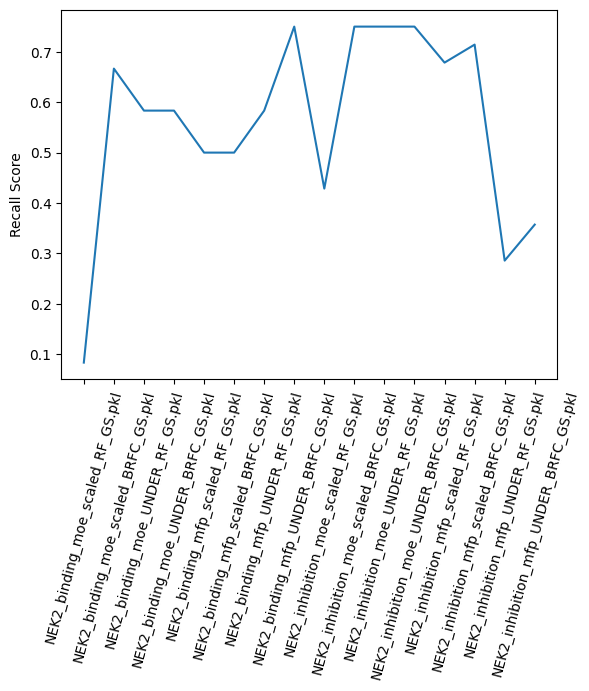

In [87]:
import matplotlib.pyplot as plt
plt.plot(test_df['model_name'], test_df['test_recall'])
plt.xticks(rotation=75)
plt.ylabel('Recall Score')
plt.show();

In [88]:
model_params_list
params_keys = set()
for dict in model_params_list: 
    for key in dict: 
        params_keys.add(key)

In [96]:
# params_keys
# len(params_keys) # 21 

In [90]:
model_params_list
params = []
for dict in model_params_list: 
    for key in dict: 
        params.append(key)
        

In [110]:
params_df = pd.DataFrame(model_params_list)
params_df
params_df = pd.concat([pd.DataFrame(model_names), params_df], axis=1)
params_df

,0,bootstrap,ccp_alpha,class_weight,criterion,max_depth,max_features,max_leaf_nodes,max_samples,min_impurity_decrease,...,min_weight_fraction_leaf,n_estimators,n_jobs,oob_score,random_state,verbose,warm_start,monotonic_cst,replacement,sampling_strategy
0,NEK2_binding_moe_scaled_RF_GS.pkl,True,0.0,balanced,gini,20,sqrt,None,None,0.0,...,0.0,100,None,False,None,0,False,NaN,NaN,NaN
1,NEK2_binding_moe_scaled_BRFC_GS.pkl,warn,0.0,None,gini,250,sqrt,None,None,0.0,...,0.0,1050,None,False,None,0,False,NaN,warn,warn
2,NEK2_binding_moe_UNDER_RF_GS.pkl,True,0.0,balanced,gini,200,sqrt,None,None,0.0,...,0.0,100,None,False,None,0,False,NaN,NaN,NaN
3,NEK2_binding_moe_UNDER_BRFC_GS.pkl,warn,0.0,balanced_subsample,gini,100,sqrt,None,None,0.0,...,0.0,100,None,False,None,0,False,NaN,warn,warn
4,NEK2_binding_mfp_scaled_RF_GS.pkl,True,0.0,balanced,entropy,250,sqrt,None,None,0.0,...,0.0,575,None,False,None,0,False,NaN,NaN,NaN
5,NEK2_binding_mfp_scaled_BRFC_GS.pkl,warn,0.0,None,gini,100,sqrt,None,None,0.0,...,0.0,1050,None,False,None,0,False,NaN,warn,warn
6,NEK2_binding_mfp_UNDER_RF_GS.pkl,True,0.0,balanced_subsample,gini,200,sqrt,None,None,0.0,...,0.0,100,None,False,None,0,False,NaN,NaN,NaN
7,NEK2_binding_mfp_UNDER_BRFC_GS.pkl,warn,0.0,balanced,gini,250,sqrt,None,None,0.0,...,0.0,100,None,False,None,0,False,NaN,warn,warn
8,NEK2_inhibition_moe_scaled_RF_GS.pkl,True,0.0,balanced_subsample,gini,200,sqrt,None,None,0.0,...,0.0,575,None,False,None,0,False,NaN,NaN,NaN
9,NEK2_inhibition_moe_scaled_BRFC_GS.pkl,warn,0.0,None,gini,250,sqrt,None,None,0.0,...,0.0,1525,None,False,None,0,False,NaN,warn,warn


In [103]:
test_df.columns

Index(['model_name', 'train_pred', 'test_pred', 'train_acc', 'test_acc',
       'train_prob', 'test_prob', 'train_prec', 'test_prec', 'train_recall',
       'test_recall', 'train_sensitivity', 'test_sensitivity',
       'train_specificity', 'test_specificity', 'test_cm'],
      dtype='object')

In [106]:
metric_df = test_df[['model_name','test_acc', 'test_prec','test_recall', 'test_specificity','test_cm']]

In [107]:
metric_df

,model_name,test_acc,test_prec,test_recall,test_specificity,test_cm
0,NEK2_binding_moe_scaled_RF_GS.pkl,0.961131,1.000000,0.083333,1.000000,"[[271, 0], [11, 1]]"
1,NEK2_binding_moe_scaled_BRFC_GS.pkl,0.731449,0.100000,0.666667,0.734317,"[[199, 72], [4, 8]]"
2,NEK2_binding_moe_UNDER_RF_GS.pkl,0.738516,0.092105,0.583333,0.745387,"[[202, 69], [5, 7]]"
3,NEK2_binding_moe_UNDER_BRFC_GS.pkl,0.738516,0.092105,0.583333,0.745387,"[[202, 69], [5, 7]]"
4,NEK2_binding_mfp_scaled_RF_GS.pkl,0.975265,0.857143,0.500000,0.996310,"[[270, 1], [6, 6]]"
5,NEK2_binding_mfp_scaled_BRFC_GS.pkl,0.897527,0.206897,0.500000,0.915129,"[[248, 23], [6, 6]]"
6,NEK2_binding_mfp_UNDER_RF_GS.pkl,0.657244,0.070707,0.583333,0.660517,"[[179, 92], [5, 7]]"
7,NEK2_binding_mfp_UNDER_BRFC_GS.pkl,0.530035,0.064748,0.750000,0.520295,"[[141, 130], [3, 9]]"
8,NEK2_inhibition_moe_scaled_RF_GS.pkl,0.953545,0.800000,0.428571,0.992126,"[[378, 3], [16, 12]]"
9,NEK2_inhibition_moe_scaled_BRFC_GS.pkl,0.872861,0.318182,0.750000,0.881890,"[[336, 45], [7, 21]]"
